In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [52]:


def frequency_table(df, column):
    """Creates and returns a frequency table for the specified column."""
    freq_table = df[column].value_counts().reset_index()
    freq_table.columns = [column, 'Frequency']
    return freq_table

def plot_bar_chart(freq_table, column):
    """Plots a bar chart for the frequency table of the specified column."""
    plt.figure(figsize=(10, 6))
    plt.bar(freq_table[column], freq_table['Frequency'], color='blue')
    plt.title(f'Bar Chart of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()   

def plot_scatter(df, column):
    """Plots a scatter plot for the specified column."""
    plt.subplot(1, 2, 2)  # Create a subplot for scatter plot
    plt.scatter(df.index, df[column], alpha=0.5, color='orange')
    plt.title(f'Scatter Plot of {column}')
    plt.xlabel('Index')
    plt.ylabel(column)
    plt.grid()

In [143]:
file_path = "../resources/data/output/online_retail_cleaned.csv"   
df = pd.read_csv(file_path)

In [144]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-01-12 08:26:00,2.55,17850.0,United Kingdom,2010,1,12
1,536365,71053,WHITE METAL LANTERN,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-01-12 08:26:00,2.75,17850.0,United Kingdom,2010,1,12
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12


In [145]:
df.shape

(392732, 11)

**Descriptive Statistics**

In [146]:
# Calculate descriptive statistics
descriptive_stats = df.drop(columns=['CustomerID', 'InvoiceNo']).describe()
descriptive_stats

,Quantity,UnitPrice,Year,Month,Day
count,392732.000000,392732.000000,392732.000000,392732.000000,392732.000000
mean,13.153718,3.125596,2010.934630,6.942118,15.704468
std,181.588420,22.240725,0.247178,3.328213,8.047342
min,1.000000,0.000000,2010.000000,1.000000,1.000000
25%,2.000000,1.250000,2011.000000,4.000000,10.000000
50%,6.000000,1.950000,2011.000000,7.000000,15.000000
75%,12.000000,3.750000,2011.000000,10.000000,22.000000
max,80995.000000,8142.750000,2011.000000,12.000000,31.000000


**Check Quantity and UnitPrice with zero**

In [147]:
# entries with Quantity equal to 0
print("Number of entries with Quantity equal to 0:", df[df['Quantity'] == 0].shape[0])

# entries with UnitPrice equal to 0
print("Number of entries with UnitPrice equal to 0:", df[df['UnitPrice'] == 0].shape[0])


Number of entries with Quantity equal to 0: 0
Number of entries with UnitPrice equal to 0: 40


**Remove UnitPrice equal to 0**

In [148]:
print(df.shape)

# Filter the DataFrame for entries where UnitPrice is equal to 0
df = df[df['UnitPrice'] != 0]

print(df.shape)

(392732, 11)
(392692, 11)


In [149]:
def plot_scatter(data, y_column, title='Scatter Plot', x_column=None):
    """ Create a scatter plot for a specified column to identify outliers."""

    plt.figure(figsize=(10, 6))

    if x_column is not None:
        sns.scatterplot(x=x_column, y=y_column, data=data)
    else:
        sns.scatterplot(x=data.index, y=y_column, data=data)

    plt.title(title)
    plt.xlabel(x_column if x_column else 'Index')
    plt.ylabel(y_column)
    plt.show()

**scatter plots for outlier detection** 

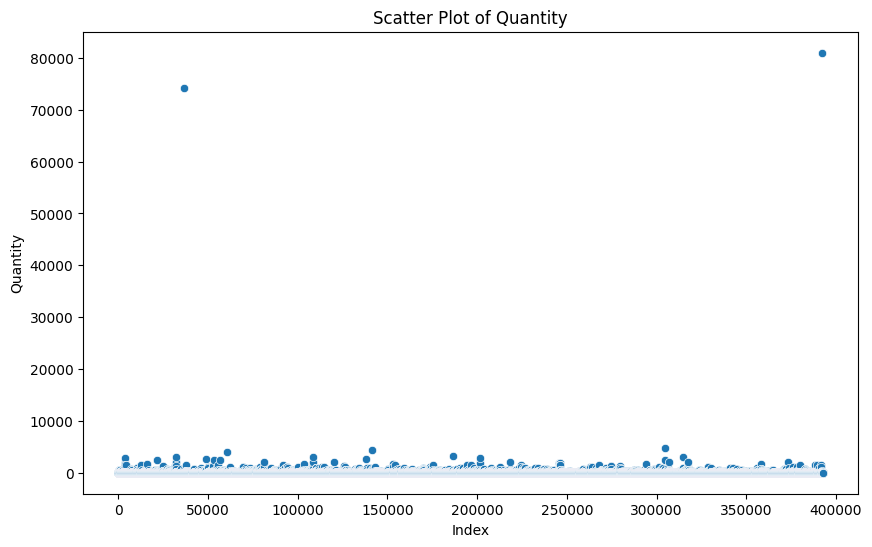

In [150]:
plot_scatter(df, 'Quantity', 'Scatter Plot of Quantity')

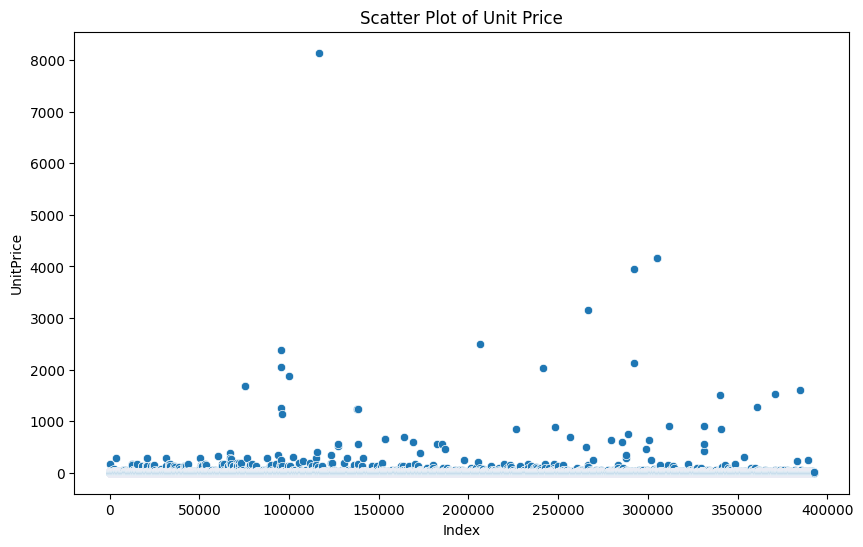

In [151]:
plot_scatter(df, 'UnitPrice', 'Scatter Plot of Unit Price')

In [152]:
def create_total_price(data):
    """Create a new column 'TotalPrice' by multiplying 'Quantity' and 'UnitPrice'."""
    data['TotalPrice'] = data['Quantity'] * data['UnitPrice']
    return data

In [153]:
df_with_total_price = create_total_price(df)

print(df_with_total_price.shape)

df_with_total_price.head()

(392692, 12)


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-01-12 08:26:00,2.55,17850.0,United Kingdom,2010,1,12,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-01-12 08:26:00,2.75,17850.0,United Kingdom,2010,1,12,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-01-12 08:26:00,3.39,17850.0,United Kingdom,2010,1,12,20.34


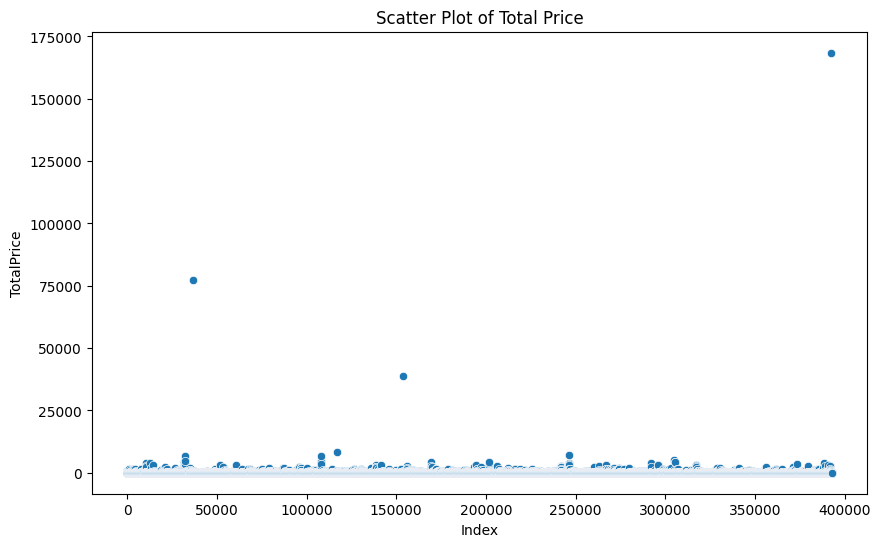

In [155]:
plot_scatter(df_with_total_price, 'TotalPrice', 'Scatter Plot of Total Price')

In [156]:
def remove_outliers(data, column):
    """Remove outliers from the specified column using the IQR method."""
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the data to remove outliers
    filtered_data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]
    return filtered_data

In [157]:
print(df_with_total_price.shape)

df_without_outlier = remove_outliers(df_with_total_price, 'TotalPrice')

print(df_without_outlier.shape)

(392692, 12)
(361461, 12)


In [158]:
df_without_outlier.to_csv('../resources/data/output/online_retail_final.csv', index=False)

**Box plots after removing outlier** 

In [159]:
def create_box_plot(df, y_column, title='Box Plot'):
    """
    Create a box plot for a specified column.

    Parameters:
    - df: DataFrame containing the data to plot.
    - y_column: str, the name of the column to plot on the y-axis.
    - title: str, title of the plot.
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=y_column, data=df)
    plt.title(title)
    plt.ylabel(y_column)
    plt.show()

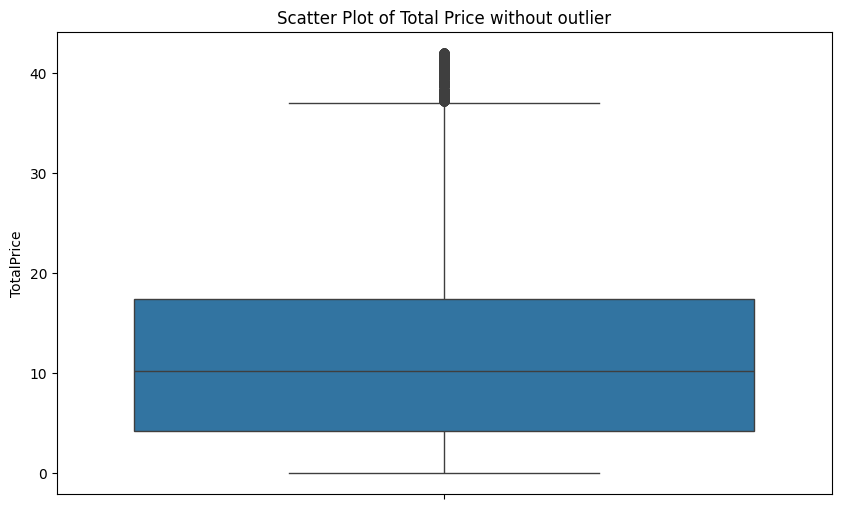

In [162]:
create_box_plot(df_without_outlier, 'TotalPrice', 'Scatter Plot of Total Price without outlier')

In [163]:
df_without_outlier.drop(columns=['CustomerID', 'InvoiceNo']).describe()

,Quantity,UnitPrice,Year,Month,Day,TotalPrice
count,361461.000000,361461.000000,361461.000000,361461.000000,361461.000000,361461.000000
mean,7.893504,2.751246,2010.935324,6.951309,15.724742,12.099769
std,10.294633,2.874569,0.245954,3.325185,8.053277,9.099644
min,1.000000,0.001000,2010.000000,1.000000,1.000000,0.001000
25%,2.000000,1.250000,2011.000000,4.000000,10.000000,4.250000
50%,4.000000,1.690000,2011.000000,7.000000,15.000000,10.200000
75%,12.000000,3.390000,2011.000000,10.000000,22.000000,17.370000
max,900.000000,40.460000,2011.000000,12.000000,31.000000,42.000000


# Corelation between Q

In [14]:
 # Calculate the number of unique customers
unique_customers = df['CustomerID'].nunique()
print(f'Number of unique customers: {unique_customers}')

Number of unique customers: 4339


# Standardizing the data 

In [23]:
import pandas as pd
import plotly.express as px
from sklearn.preprocessing import MinMaxScaler
import numpy as np

def remove_outliers_iqr(data, column):
    """Removes outliers from the specified column using the IQR method."""
    try:
        # Calculate the Q1 and q3
        q1 = data[column].quantile(0.25)
        q3 = data[column].quantile(0.75)

        # Calculate the IQR
        iqr = q3 - q1

        # Calculate the lower and upper bounds
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Remove outliers
        data = data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

        return data
    except Exception as e:
        print(f"Failed to remove outliers: {e}")

def standardize_data(data):
    """Standardizes the data using the MinMaxScaler."""
    try:
        # Check if the input data is a pandas DataFrame
        if not isinstance(data, pd.DataFrame):
            raise ValueError("Input data must be a pandas DataFrame")

        # Check if the DataFrame contains the expected columns
        required_columns = ["Quantity", "UnitPrice"]
        if not all(column in data.columns for column in required_columns):
            raise ValueError("DataFrame must contain 'Quantity' and 'UnitPrice' columns")

        # Check if the data is numeric
        if not pd.api.types.is_numeric_dtype(data["Quantity"]) or not pd.api.types.is_numeric_dtype(data["UnitPrice"]):
            raise ValueError("Data must be numeric")

        # Remove outliers
        data = remove_outliers_iqr(data, "Quantity")
        data = remove_outliers_iqr(data, "UnitPrice")

        # Create a MinMaxScaler model
        scaler = MinMaxScaler()

        # Fit the model to the data and transform the data
        data[["Quantity", "UnitPrice"]] = scaler.fit_transform(data[["Quantity", "UnitPrice"]])

        return data
    except Exception as e:
        print(f"Failed to standardize data: {e}")

def calculate_rfm(data):
    """Calculates the RFM values for each customer."""
    try:
        # Calculate the Recency (R) value
        data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])
        data['Recency'] = (data['InvoiceDate'].max() - data['InvoiceDate']).dt.days

        # Calculate the Frequency (F) value
        data_freq = data.groupby('CustomerID')['InvoiceNo'].count().reset_index()
        data_freq.columns = ['CustomerID', 'Frequency']
        data = pd.merge(data, data_freq, on='CustomerID')

        # Calculate the Monetary (M) value
        data['TotalSpent'] = data['Quantity'] * data['UnitPrice']
        data_monet = data.groupby('CustomerID')['TotalSpent'].sum().reset_index()
        data_monet.columns = ['CustomerID', 'Monetary']
        data = pd.merge(data, data_monet, on='CustomerID')

        # Logarithmic transformation
        data['LogRecency'] = np.log1p(data['Recency'])
        data['LogFrequency'] = np.log1p(data['Frequency'])
        data['LogMonetary'] = np.log1p(data['Monetary'])

        # Calculate the RFM score
        data['RFM'] = data['LogRecency'] + data['LogFrequency'] + data['LogMonetary']

        return data
    except Exception as e:
        print(f"Failed to calculate RFM: {e}")

def plot_rfm_distribution(data):
    """Plots the distribution of RFM values."""
    try:
        # Plot the distribution of Recency (R) values
        fig_recency = px.histogram(data, x='LogRecency', title='Distribution of Recency')
        fig_recency.show()

        # Plot the distribution of Frequency (F) values
        fig_frequency = px.histogram(data, x='LogFrequency', title='Distribution of Frequency')
        fig_frequency.show()

        # Plot the distribution of Monetary (M) values
        fig_monetary = px.histogram(data, x='LogMonetary', title='Distribution of Monetary')
        fig_monetary.show()
    except Exception as e:
        print(f"Failed to plot RFM distribution: {e}")


# Standardize data
std_df = standardize_data(df)

# Calculate RFM values
rfm_df = calculate_rfm(std_df)

# Plot RFM distribution
plot_rfm_distribution(rfm_df)

In [21]:
std_df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Year,Month,Day,TotalAmount
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,0.192308,2010-01-12 08:26:00,0.340000,17850.0,United Kingdom,2010,1,12,15.30
1,536365,71053,WHITE METAL LANTERN,0.192308,2010-01-12 08:26:00,0.452000,17850.0,United Kingdom,2010,1,12,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,0.269231,2010-01-12 08:26:00,0.366667,17850.0,United Kingdom,2010,1,12,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,0.192308,2010-01-12 08:26:00,0.452000,17850.0,United Kingdom,2010,1,12,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,0.192308,2010-01-12 08:26:00,0.452000,17850.0,United Kingdom,2010,1,12,20.34
...,...,...,...,...,...,...,...,...,...,...,...,...
392727,581587,22613,PACK OF 20 SPACEBOY NAPKINS,0.423077,2011-09-12 12:50:00,0.113333,12680.0,France,2011,9,12,10.20
392728,581587,22899,CHILDREN'S APRON DOLLY GIRL,0.192308,2011-09-12 12:50:00,0.280000,12680.0,France,2011,9,12,12.60
392729,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,0.115385,2011-09-12 12:50:00,0.553333,12680.0,France,2011,9,12,16.60
392730,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,0.115385,2011-09-12 12:50:00,0.553333,12680.0,France,2011,9,12,16.60


In [31]:
import pandas as pd
import numpy as np
import plotly.express as px
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage

def calculate_rfm(data):
    """Calculates the RFM values for each customer."""
    data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])
    data['Recency'] = (data['InvoiceDate'].max() - data['InvoiceDate']).dt.days

    data_freq = data.groupby('CustomerID')['InvoiceNo'].count().reset_index()
    data_freq.columns = ['CustomerID', 'Frequency']
    data = pd.merge(data, data_freq, on='CustomerID')

    data['TotalSpent'] = data['Quantity'] * data['UnitPrice']
    data_monet = data.groupby('CustomerID')['TotalSpent'].sum().reset_index()
    data_monet.columns = ['CustomerID', 'Monetary']
    data = pd.merge(data, data_monet, on='CustomerID')

    return data[['CustomerID', 'Recency', 'Frequency', 'Monetary']].drop_duplicates()

def calculate_rfm_scores(data):
    """Calculates RFM scores based on quantiles."""
    rfm_scores = data.copy()
    rfm_scores['R_score'] = pd.qcut(rfm_scores['Recency'], 5, labels=False)
    rfm_scores['F_score'] = pd.qcut(rfm_scores['Frequency'], 5, labels=False)
    rfm_scores['M_score'] = pd.qcut(rfm_scores['Monetary'], 5, labels=False)

    # Calculate overall RFM score
    rfm_scores['RFM_score'] = rfm_scores['R_score'] + rfm_scores['F_score'] + rfm_scores['M_score']

    # Apply logarithmic transformation
    rfm_scores['Log_Recency'] = np.log1p(rfm_scores['Recency'])
    rfm_scores['Log_Frequency'] = np.log1p(rfm_scores['Frequency'])
    rfm_scores['Log_Monetary'] = np.log1p(rfm_scores['Monetary'])

    return rfm_scores


def plot_rfm_distribution(rfm_scores):
    """Plots distribution of Log Recency, Log Frequency, and Log Monetary values."""
    fig = px.histogram(rfm_scores, x='Log_Recency', title='Log Recency Distribution', nbins=30)
    fig.show()

    fig = px.histogram(rfm_scores, x='Log_Frequency', title='Log Frequency Distribution', nbins=30)
    fig.show()

    fig = px.histogram(rfm_scores, x='Log_Monetary', title='Log Monetary Distribution', nbins=30)
    fig.show()


def apply_kmeans(rfm_scores, max_clusters=10):
    """Applies K-Means clustering on RFM scores and uses elbow method."""
    inertia_list = []
    silhouette_list = []

    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']])
        inertia_list.append(kmeans.inertia_)
        silhouette_list.append(silhouette_score(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], cluster_labels))

    # Plot elbow curve
    fig = px.line(x=range(2, max_clusters + 1), y=inertia_list, markers=True, title='Elbow Method for Optimal k')
    fig.show()

    return inertia_list, silhouette_list


def apply_dbscan(rfm_scores):
    """Applies DBSCAN clustering on RFM scores."""
    dbscan = DBSCAN(eps=0.5, min_samples=5)
    rfm_scores['DBSCAN_Cluster'] = dbscan.fit_predict(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']])
    return rfm_scores


def apply_hierarchical(rfm_scores):
    """Applies Hierarchical clustering on RFM scores and plots dendrogram."""
    linked = linkage(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], 'ward')

    fig = plt.figure(figsize=(10, 7))
    dendrogram(linked, orientation='top', labels=rfm_scores['CustomerID'].values, distance_sort='descending', show_leaf_counts=True)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Customer ID')
    plt.ylabel('Distance')
    fig.show()


# Calculate RFM values
rfm_df = calculate_rfm(std_df)

# Calculate RFM scores
rfm_scores = calculate_rfm_scores(rfm_df)

# Plot RFM distribution
plot_rfm_distribution(rfm_scores)


In [46]:
# K-Means clustering with elbow method
# inertia_list, silhouette_list = apply_kmeans(rfm_scores)

import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.cluster import KMeans

# Example number of clusters determined by the elbow method
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)

# Fit the model and predict clusters
rfm_scores['KMeans_Cluster'] = kmeans.fit_predict(rfm_scores[['Recency', 'Frequency', 'Monetary']])

# Calculate cluster profiles (mean values for each cluster)
cluster_profiles = rfm_scores.groupby('KMeans_Cluster')[['Recency', 'Frequency', 'Monetary']].mean().reset_index()

# Assign meaningful labels based on cluster profiles
# Example mapping (adjust based on your actual data)
cluster_mapping = {
    0: 'Loyal Customers',       # High Frequency and Recency
    1: 'Churned Customers',    # High Recency, Low Frequency
    2: 'High-Spending Infrequent',  # High Monetary, Low Frequency
    3: 'New Customers',         # Low Recency, High Frequency
    4: 'Low-Value Customers'     # Low Monetary, Frequency, and Recency
}

# Map cluster IDs to meaningful labels
rfm_scores['Customer_Segment'] = rfm_scores['KMeans_Cluster'].map(cluster_mapping)

# Create a figure
fig = go.Figure()

# Add the scatter plot for customers with categorical labels
fig.add_trace(go.Scatter3d(
    x=rfm_scores['Recency'],
    y=rfm_scores['Frequency'],
    z=rfm_scores['Monetary'],
    mode='markers',
    name='Customers',
    marker=dict(
        color=pd.Categorical(rfm_scores['Customer_Segment']).codes,
        colorscale='viridis',
        colorbar=dict(title='Customer Segment'),
        opacity=0.8
    ),
    hoverinfo='text',
    hovertext=rfm_scores['Customer_Segment']
))

# Add the centroids
centroids = kmeans.cluster_centers_
fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers',
    name='Centroids',
    marker=dict(color='red', size=10, symbol='x')
))

# Update the layout
fig.update_layout(
    title='3D K-Means Clustering Results with Categorical Labels',
    scene=dict(
        xaxis_title='Recency',
        yaxis_title='Frequency',
        zaxis_title='Monetary'),
    width=1000,
    height=800,
    font=dict(size=12),
    hovermode='x unified',
    showlegend=True
)

# Show the plot
fig.show()

# Optional: Display cluster sizes
cluster_sizes = rfm_scores['Customer_Segment'].value_counts().reset_index()
cluster_sizes.columns = ['Customer_Segment', 'Count']

# Create a bar chart for cluster sizes
fig_bar = go.Figure(data=[go.Bar(x=cluster_sizes['Customer_Segment'], y=cluster_sizes['Count'])])
fig_bar.update_layout(
    title='Cluster Sizes',
    xaxis_title='Customer Segment',
    yaxis_title='Count',
    width=800,
    height=600
)
fig_bar.show()



In [33]:
# DBSCAN clustering
rfm_scores_dbscan = apply_dbscan(rfm_scores)

/var/folders/x7/zz5b68y51xv5_26y13jhyzjh0000gn/T/ipykernel_80960/2810220625.py:94: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown



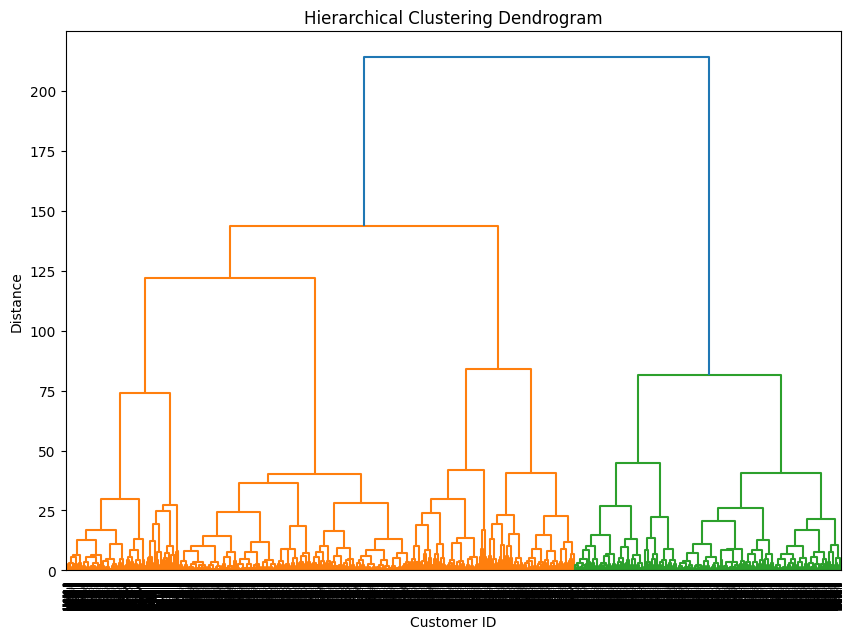

In [34]:
# Hierarchical clustering
apply_hierarchical(rfm_scores)

In [35]:
# Display clustering results
print("DBSCAN Clustering Results:")
print(rfm_scores_dbscan[['CustomerID', 'DBSCAN_Cluster']])

# Display silhouette scores
print("Silhouette Scores for different K in K-Means:")
for i, score in enumerate(silhouette_list, start=2):
    print(f"K = {i}: {score:.2f}")

DBSCAN Clustering Results:
        CustomerID  DBSCAN_Cluster
0          17850.0               0
8          13047.0               0
21         12583.0               0
72         14688.0               0
88         17809.0               0
...            ...             ...
333172     17581.0               0
333198     12748.0               1
333226     15804.0               0
333247     13113.0               0
333250     12680.0               0

[15552 rows x 2 columns]
Silhouette Scores for different K in K-Means:
K = 2: 0.35
K = 3: 0.28
K = 4: 0.33
K = 5: 0.31
K = 6: 0.32
K = 7: 0.28
K = 8: 0.29
K = 9: 0.29
K = 10: 0.28


DBSCAN Silhouette Score: 0.303


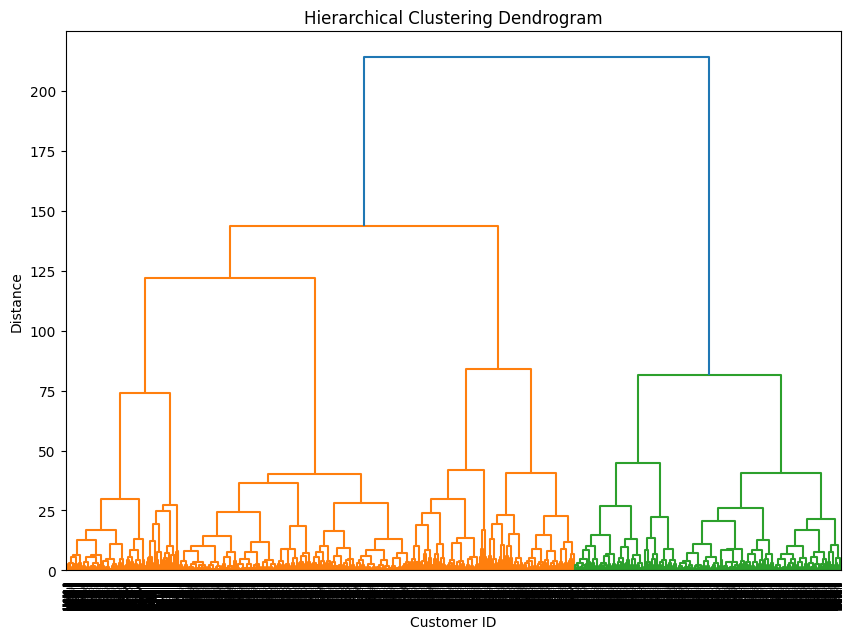

Hierarchical Clustering Silhouette Score (k=3): 0.303

DBSCAN Clustering Results:
    CustomerID  DBSCAN_Cluster
0      17850.0               0
8      13047.0               0
21     12583.0               0
72     14688.0               0
88     17809.0               0


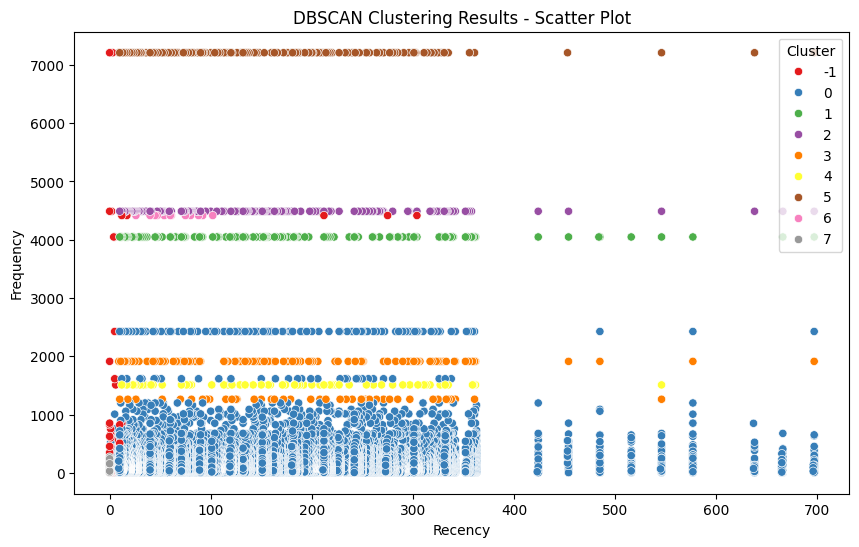


Silhouette Scores for different K in K-Means:
K = 2: 0.35
K = 3: 0.28
K = 4: 0.33
K = 5: 0.31
K = 6: 0.32
K = 7: 0.28
K = 8: 0.29
K = 9: 0.29
K = 10: 0.28


In [38]:
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import dendrogram, linkage, cut_tree

def calculate_rfm(data):
    """Calculates the RFM values for each customer."""
    data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])
    data['Recency'] = (data['InvoiceDate'].max() - data['InvoiceDate']).dt.days

    data_freq = data.groupby('CustomerID')['InvoiceNo'].count().reset_index()
    data_freq.columns = ['CustomerID', 'Frequency']
    data = pd.merge(data, data_freq, on='CustomerID')

    data['TotalSpent'] = data['Quantity'] * data['UnitPrice']
    data_monet = data.groupby('CustomerID')['TotalSpent'].sum().reset_index()
    data_monet.columns = ['CustomerID', 'Monetary']
    data = pd.merge(data, data_monet, on='CustomerID')

    return data[['CustomerID', 'Recency', 'Frequency', 'Monetary']].drop_duplicates()

def calculate_rfm_scores(data):
    """Calculates RFM scores based on quantiles."""
    rfm_scores = data.copy()
    rfm_scores['R_score'] = pd.qcut(rfm_scores['Recency'], 5, labels=False)
    rfm_scores['F_score'] = pd.qcut(rfm_scores['Frequency'], 5, labels=False)
    rfm_scores['M_score'] = pd.qcut(rfm_scores['Monetary'], 5, labels=False)

    # Calculate overall RFM score
    rfm_scores['RFM_score'] = rfm_scores['R_score'] + rfm_scores['F_score'] + rfm_scores['M_score']

    # Apply logarithmic transformation
    rfm_scores['Log_Recency'] = np.log1p(rfm_scores['Recency'])
    rfm_scores['Log_Frequency'] = np.log1p(rfm_scores['Frequency'])
    rfm_scores['Log_Monetary'] = np.log1p(rfm_scores['Monetary'])

    return rfm_scores

def plot_rfm_distribution(rfm_scores):
    """Plots distribution of Log Recency, Log Frequency, and Log Monetary values."""
    fig = px.histogram(rfm_scores, x='Log_Recency', title='Log Recency Distribution', nbins=30)
    fig.show()

    fig = px.histogram(rfm_scores, x='Log_Frequency', title='Log Frequency Distribution', nbins=30)
    fig.show()

    fig = px.histogram(rfm_scores, x='Log_Monetary', title='Log Monetary Distribution', nbins=30)
    fig.show()

def apply_kmeans(rfm_scores, max_clusters=10):
    """Applies K-Means clustering on RFM scores and uses elbow method."""
    inertia_list = []
    silhouette_list = []

    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']])
        inertia_list.append(kmeans.inertia_)
        silhouette_list.append(silhouette_score(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], cluster_labels))

    # Plot elbow curve
    fig = px.line(x=range(2, max_clusters + 1), y=inertia_list, markers=True, title='Elbow Method for Optimal k')
    fig.show()

    return inertia_list, silhouette_list

def apply_dbscan(rfm_scores):
    """Applies DBSCAN clustering on RFM scores."""
    dbscan = DBSCAN(eps=0.5, min_samples=5)
    cluster_labels = dbscan.fit_predict(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']])

    # Create a copy of the DataFrame with the cluster labels
    rfm_scores_dbscan = rfm_scores.copy()
    rfm_scores_dbscan['DBSCAN_Cluster'] = cluster_labels

    return rfm_scores_dbscan

def apply_hierarchical(rfm_scores):
    """Applies Hierarchical clustering on RFM scores and plots dendrogram."""
    linked = linkage(rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], 'ward')

    # Plot dendrogram
    plt.figure(figsize=(10, 7))
    dendrogram(linked, orientation='top', labels=rfm_scores['CustomerID'].values,
                distance_sort='descending', show_leaf_counts=True)
    plt.title('Hierarchical Clustering Dendrogram')
    plt.xlabel('Customer ID')
    plt.ylabel('Distance')
    plt.show()

    # Determine optimal number of clusters (example with 3 clusters)
    n_clusters = 3  # Adjust based on dendrogram visualization
    cluster_labels = cut_tree(linked, n_clusters=n_clusters).flatten()

    # Calculate silhouette score
    if n_clusters > 1:
        hierarch_silhouette = silhouette_score(
            rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], cluster_labels)
        print(f"Hierarchical Clustering Silhouette Score (k={n_clusters}): {hierarch_silhouette:.3f}")
    else:
        print("Not enough clusters for Silhouette Score.")

    return cluster_labels


# Calculate RFM values
rfm_df = calculate_rfm(std_df)

# Calculate RFM scores
rfm_scores = calculate_rfm_scores(rfm_df)

# Plot RFM distribution
plot_rfm_distribution(rfm_scores)

# K-Means clustering with elbow method
inertia_list, silhouette_list = apply_kmeans(rfm_scores)

# DBSCAN clustering
rfm_scores_dbscan = apply_dbscan(rfm_scores)

# Compute DBSCAN silhouette score
if len(rfm_scores_dbscan['DBSCAN_Cluster'].unique()) > 1:
    dbscan_silhouette = silhouette_score(
        rfm_scores[['Log_Recency', 'Log_Frequency', 'Log_Monetary']], 
        rfm_scores_dbscan['DBSCAN_Cluster'])
    print(f"DBSCAN Silhouette Score: {dbscan_silhouette:.3f}")
else:
    print("Not enough clusters for DBSCAN Silhouette Score.")

# Hierarchical clustering
hierarch_clusters = apply_hierarchical(rfm_scores)

# Display clustering results
print("\nDBSCAN Clustering Results:")
print(rfm_scores_dbscan[['CustomerID', 'DBSCAN_Cluster']].head())


# Plotting a scatter plot for 'Recency' vs. 'Frequency'
plt.figure(figsize=(10, 6))
sns.scatterplot(data=rfm_scores_dbscan, x='Recency', y='Frequency', hue='DBSCAN_Cluster', palette='Set1')

# Adding labels and title
plt.title('DBSCAN Clustering Results - Scatter Plot')
plt.xlabel('Recency')
plt.ylabel('Frequency')
plt.legend(title='Cluster')

# Show plot
plt.show()


print("\nSilhouette Scores for different K in K-Means:")
for i, score in enumerate(silhouette_list, start=2):
    print(f"K = {i}: {score:.2f}")

In [12]:
def eda_rfm_plots(df):
    """Generates EDA plots using Matplotlib."""
    customer_recency = df.groupby('CustomerID')['InvoiceDate'].max().reset_index()
    plt.figure(figsize=(10,6))
    sns.histplot(customer_recency['InvoiceDate'], kde=True)
    plt.title('Distribution of Recency')
    plt.show()

    top_customers = df.groupby('CustomerID')['TotalAmount'].sum().sort_values(ascending=False).head(10).reset_index()
    plt.figure(figsize=(10, 6))
    sns.barplot(x='CustomerID', y='TotalAmount', data=top_customers)
    plt.title('Top 10 Customers by Monetary Value')
    plt.xticks(rotation=45, ha='right')  
    plt.show()

    top_products = df.groupby('Description')['Quantity'].sum().sort_values(ascending=False).head(10).reset_index()
    plt.figure(figsize=(10, 6))
    sns.barplot(x='Description', y='Quantity', data=top_products)
    plt.title('Top 10 Products by Quantity Sold')
    plt.xticks(rotation=45, ha='right') 
    plt.show()

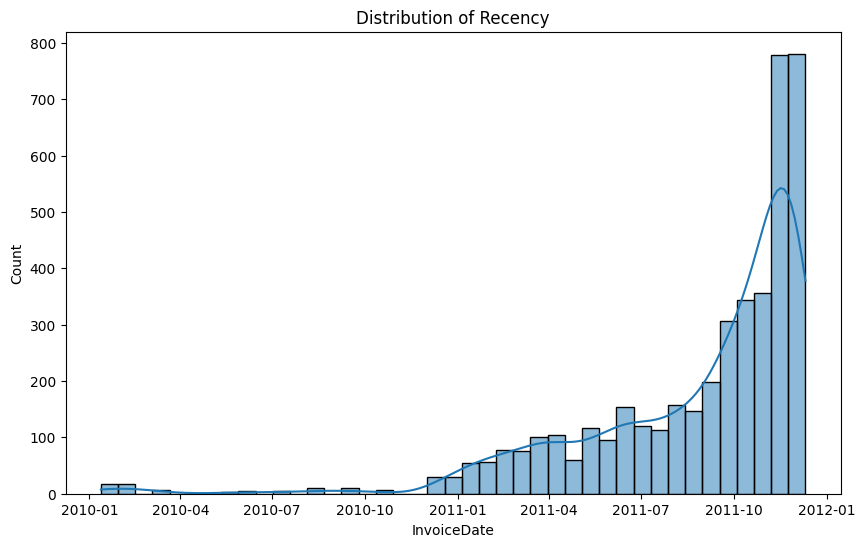

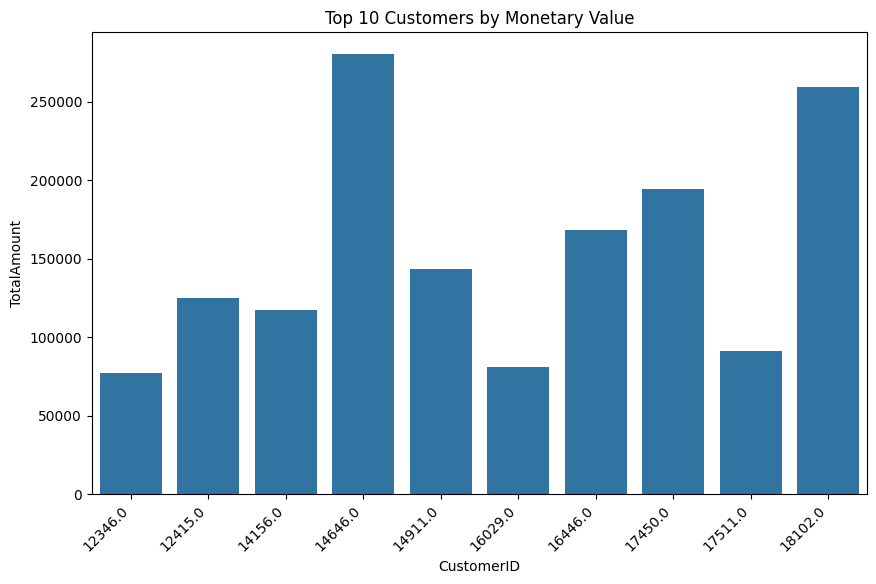

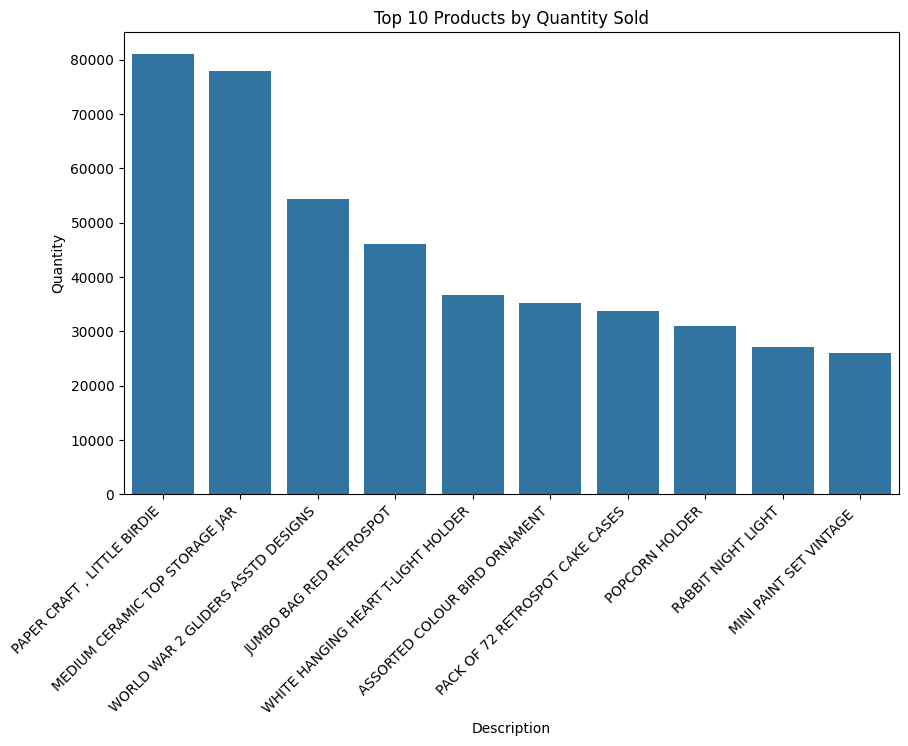

In [13]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
df['TotalAmount'] = df['Quantity'] * df['UnitPrice']
eda_rfm_plots(df)

In [17]:
import pandas as pd
import numpy as np
import plotly.express as px

def load_data(file_path):
    """Load the dataset from the specified file path and filter for UK customers."""
    data = pd.read_csv(file_path)
    data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])  # Convert InvoiceDate to datetime
    data = data[data['Country'] == 'United Kingdom']  # Filter for UK customers
    return data

def identify_and_filter_outliers(data):
    """Identify outliers using the Z-score method and return filtered data."""
    # Calculate Z-scores
    quantity_z = np.abs((data['Quantity'] - data['Quantity'].mean()) / data['Quantity'].std())
    unit_price_z = np.abs((data['UnitPrice'] - data['UnitPrice'].mean()) / data['UnitPrice'].std())

    # Define a threshold for outliers
    threshold = 3  # Common threshold for Z-score outlier detection

    # Identify outliers
    outliers_mask = (quantity_z > threshold) | (unit_price_z > threshold)

    # Filter out outliers
    filtered_data = data[~outliers_mask]

    return filtered_data

def main():
    """Main function to load data, filter outliers, and visualize."""
    # Define the file path for the dataset
    file_path = '/Users/jagadeesch/ai_projects/online-retail-customer-segmentation/resources/data/output/online_retail_cleaned.csv'

    # Load the data
    data = load_data(file_path)

    # Identify and filter outliers
    filtered_data = identify_and_filter_outliers(data)

    # Display the number of records after filtering outliers
    print("Number of records after filtering out outliers:", len(filtered_data))

    # Create scatter plot for filtered data
    fig = px.scatter(filtered_data, x='Quantity', y='UnitPrice', 
                     title='Scatter Plot of Quantity vs Unit Price (Outliers Filtered)',
                     labels={'Quantity': 'Quantity', 'UnitPrice': 'Unit Price'})

    # Show the plot
    fig.show()

if __name__ == "__main__":
    main()


Number of records after filtering out outliers: 348744
